In [1]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
from matplotlib import pyplot as plt
from abnumber import Chain
from bin.utils import heading
from bin.evaluation import plot_oasis_curves, plot_overlap, plot_overlap_boxplot, plot_overlap_venns, \
    plot_overlap_venn, collect_positions, read_oasis_chains
import matplotlib
matplotlib.rcParams['hatch.linewidth'] = 0.8
from scipy import stats

%load_ext autoreload
%autoreload 2

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [2]:
TASK_DIR = '../../data/tasks/therapeutic_rediscovery'
GERMLINE = 'automatic'

In [3]:
PARENTAL = dict(
    name='Parental',
    color='tab:red',
    ls='-',
    path=os.path.join(TASK_DIR, 'oas_cdr_hits/parental')
)

EXPERIMENTAL = dict(
    name='Experimental',
    color='tab:green',
    ls='-',
    path=os.path.join(TASK_DIR, 'thera/humanized')
)

HUMAB = dict(
    name='Hu-mAb',
    color='#ff9698',
    ls='-',
    path=os.path.join(TASK_DIR, f'humab/humab_{GERMLINE}')
)

VERNIER_GRAFT = dict(
    name='Vernier graft',
    color='tab:orange',
    ls='--',
    path=os.path.join(TASK_DIR, f'cdr_grafts_{GERMLINE}/vernier_grafts')
)

STRAIGHT_GRAFT = dict(
    name='Straight graft',
    color='tab:cyan',
    ls='--',
    path=os.path.join(TASK_DIR, f'cdr_grafts_{GERMLINE}/straight_grafts')
)

SAPIENS = dict(
    name='Sapiens*1',
    color='#a020c0',
    ls='-',
    path=os.path.join(TASK_DIR, f'predicted_{GERMLINE}/sapiens1')
)

METHODS = [
    PARENTAL,
    EXPERIMENTAL,
    SAPIENS,
    HUMAB,
    VERNIER_GRAFT,
    STRAIGHT_GRAFT
]

HUMANIZED_METHODS = [
    EXPERIMENTAL,
    SAPIENS,
    HUMAB,
    STRAIGHT_GRAFT,
    VERNIER_GRAFT,
]

HUMANIZED_METHOD_NAMES = [method['name'] for method in HUMANIZED_METHODS]


SELECTED_METHODS = [
    PARENTAL,
    EXPERIMENTAL,
    SAPIENS,
    HUMAB,
    STRAIGHT_GRAFT,
    VERNIER_GRAFT,
]

SELECTED_METHOD_NAMES = [method['name'] for method in SELECTED_METHODS]


COLORS = {method['name']: method['color'] for method in METHODS}
LINESTYLES = {method['name']: method['ls'] for method in METHODS}

HUMANIZED_COLORS = {method['name']: method['color'] for method in HUMANIZED_METHODS}

SELECTED_COLORS = {method['name']: method['color'] for method in SELECTED_METHODS}

In [4]:
parental_heavy, parental_light, _, _ = read_oasis_chains(PARENTAL['path'] + '_oasis.xlsx')
NAMES = parental_heavy.index.values

In [5]:
experimental_heavy, experimental_light, experimental_heavy_germlines, experimental_light_germlines = read_oasis_chains(
    EXPERIMENTAL['path'] + '_oasis.xlsx', 
    index=NAMES
)

print(parental_heavy[0].align(experimental_heavy[0], experimental_heavy_germlines[0]))
print()
print(parental_light[0].align(experimental_light[0], experimental_light_germlines[0]))

QVQLQQSGAELAKPGASVKLSCKASGYTFTSFWMHWVKQRPGQGLEWIGYINPRSGYTEYNEIFRDKATLTADKSSSTAYMQLSSLTSEDSAVYYCARFLGRGAMDYWGQGTSVTVSS
||||||||.||||||||||+|||||||||+|||||||+|.|||||||||||||||||||||||||||||+|.|.|+|||||+||||.|||+||||||.||||||||||||||+|||||
QVQLQQSGGELAKPGASVKVSCKASGYTFSSFWMHWVRQAPGQGLEWIGYINPRSGYTEYNEIFRDKATMTTDTSTSTAYMELSSLRSEDTAVYYCASFLGRGAMDYWGQGTTVTVSS
||||.|||.|+.|||||||||||||||||+|++||||||||||||||+|.|||..|.|.|.+.|+.+.|||.||||||.||||||||||||||||||......|.|.|||||.|||||
QVQLVQSGAEVKKPGASVKVSCKASGYTFTSYYMHWVRQAPGQGLEWMGIINPSGGSTSYAQKFQGRVTMTRDTSTSTVYMELSSLRSEDTAVYYCAR----DAFDVWGQGTMVTVSS
 °                        °°°°^^^^^           °°°^^^^^^^^^^^^^^^^^ ° ° ° °    °                 °°^^^^^^^^^°          

DIQMTQTTSSLSASLGDRVTISCRASQDISNYLAWYQQKPDGTIKLLIYYTSKIHSGVPSRFSGSGSGTDYSLTISNLEQEDIATYFCQQGNTFPYTFGGGTKLEIK
||||||+.||||||+||||||+||||||||||||||||||....|||||||||||||||||||||||||||+.|||+|+.||||||+||||||||||||.|||+|||
DIQMTQSPSSLSASVGDRVTITCRASQDISNYLAWYQQKPGKAPKLLIYYTSKIHSGVPSRFSGSGSGT

In [59]:
oasis_meta = []
oasis_curves = []
t20_scores = []
positions = []

for method in METHODS:
    oasis_method = pd.read_excel(method['path'] + '_oasis.xlsx', index_col=0)
    oasis_method = oasis_method.loc[NAMES].reset_index()
    oasis_method.insert(0, 'Method', method['name'])
    oasis_meta.append(oasis_method)
    
    oasis_curve = pd.read_excel(method['path'] + '_oasis.xlsx', sheet_name='OASis Curves', index_col=0)
    oasis_curve = oasis_curve.loc[NAMES].reset_index()
    oasis_curve.insert(0, 'Method', method['name'])
    oasis_curves.append(oasis_curve)
    
    t20_score = pd.read_csv(method['path'] + '_T20.tsv', sep='\t').rename(columns={'id': 'Antibody'})
    t20_score = t20_score.groupby('Antibody')['t20'].mean()
    t20_score = t20_score.loc[NAMES].reset_index()
    t20_score.insert(0, 'Method', method['name'])
    t20_scores.append(t20_score)
    
    method_heavy, method_light, germline_heavy, germline_light = read_oasis_chains(
        method['path'] + '_oasis.xlsx', 
        index=NAMES
    )
    
    heavy_positions = collect_positions(
        parental_heavy, 
        method_heavy, 
        germline_heavy,
    )
    heavy_positions.insert(0, 'Method', method['name'])
    heavy_positions.insert(1, 'Chain', 'Heavy')
    positions.append(heavy_positions)
    
    light_positions = collect_positions(
        parental_light, 
        method_light,
        germline_light
    )
    light_positions.insert(0, 'Method', method['name'])
    light_positions.insert(1, 'Chain', 'Light')
    positions.append(light_positions)

del oasis_curve, t20_score, heavy_positions, light_positions
oasis_meta = pd.concat(oasis_meta)
oasis_curves = pd.concat(oasis_curves)
t20_scores = pd.concat(t20_scores)
positions = pd.concat(positions)

In [37]:
oasis_meta.head(2)

,Method,Antibody,Threshold,OASis Percentile,OASis Identity,Non-human peptides,Heavy V Germline,Heavy J Germline,Heavy OASis Percentile,Heavy OASis Identity,Light V Germline,Light J Germline,Light OASis Percentile,Light OASis Identity,Heavy Non-human peptides,Light Non-human peptides
0,Parental,Abituzumab,relaxed,0.080297,0.564593,91.0,IGHV1-46*01,IGHJ3*01,0.085273,0.545455,IGKV1-27*01,IGKJ2*01,0.085273,0.545455,NaN,NaN
1,Parental,Afutuzumab,relaxed,0.024186,0.474419,113.0,IGHV1-69*02,IGHJ4*01,0.022514,0.378378,IGKV2-28*01,IGKJ2*01,0.022514,0.378378,NaN,NaN


In [12]:
oasis_curves.head(2)

,Method,Antibody,0%,1%,2%,3%,4%,5%,6%,7%,...,81%,82%,83%,84%,85%,86%,87%,88%,89%,90%
0,Parental,Abituzumab,1.0,0.693780,0.669856,0.636364,0.617225,0.607656,0.602871,0.602871,...,0.311005,0.311005,0.306220,0.306220,0.306220,0.301435,0.301435,0.301435,0.301435,0.296651
1,Parental,Afutuzumab,1.0,0.618605,0.586047,0.567442,0.567442,0.558140,0.525581,0.516279,...,0.334884,0.334884,0.330233,0.330233,0.330233,0.330233,0.330233,0.330233,0.325581,0.325581


In [13]:
t20_scores.head(2)

,Method,Antibody,t20
0,Parental,Abituzumab,71.91157
1,Parental,Afutuzumab,73.81437


In [14]:
positions.head(2)

,Method,Chain,name,pos,chain,region,in_vernier,parental,predicted,germline,conservation
0,Parental,Heavy,Abituzumab,H1,Heavy,FR1,False,Q,Q,Q,Conserved
1,Parental,Heavy,Abituzumab,H2,Heavy,FR1,True,V,V,V,Conserved


In [15]:
writer = pd.ExcelWriter(os.path.join(TASK_DIR, f'152_pairs_{GERMLINE}_germline_report.xlsx'), engine='xlsxwriter')

oasis_curves.to_excel(writer, sheet_name='OASis', index=False)
t20_scores.to_excel(writer, sheet_name='T20', index=False)
positions.to_excel(writer, sheet_name='Positions', index=False)

writer.close()

## Germline families

In [39]:
germline_families = oasis_meta[['Antibody','Method','Heavy V Germline','Light V Germline']].copy()
germline_families['Heavy V Family'] = germline_families['Heavy V Germline'].apply(lambda s: s.split('-')[0].split('/')[0].replace('D',''))
germline_families['Light V Family'] = germline_families['Light V Germline'].apply(lambda s: s.split('-')[0].split('/')[0].replace('D',''))
germline_families['Heavy V Gene'] = germline_families['Heavy V Germline'].apply(lambda s: s.split('*')[0])
germline_families['Light V Gene'] = germline_families['Light V Germline'].apply(lambda s: s.split('*')[0])
germline_families.head()

,Antibody,Method,Heavy V Germline,Light V Germline,Heavy V Family,Light V Family,Heavy V Gene,Light V Gene
0,Abituzumab,Parental,IGHV1-46*01,IGKV1-27*01,IGHV1,IGKV1,IGHV1-46,IGKV1-27
1,Afutuzumab,Parental,IGHV1-69*02,IGKV2-28*01,IGHV1,IGKV2,IGHV1-69,IGKV2-28
2,Alacizumab,Parental,IGHV3-7*01,IGKV1-16*01,IGHV3,IGKV1,IGHV3-7,IGKV1-16
3,Alemtuzumab,Parental,IGHV3-71*01,IGKV1-39*01,IGHV3,IGKV1,IGHV3-71,IGKV1-39
4,Anrukinzumab,Parental,IGHV3-21*01,IGKV7-3*01,IGHV3,IGKV7,IGHV3-21,IGKV7-3


In [40]:
heavy_families = germline_families.set_index(['Antibody','Method'])['Heavy V Family'].unstack()
heavy_families.head()

Method,Experimental,Hu-mAb,Parental,Sapiens*1,Straight graft,Vernier graft
Antibody,,,,,,
Abituzumab,IGHV1,IGHV1,IGHV1,IGHV1,IGHV1,IGHV1
Afutuzumab,IGHV1,IGHV1,IGHV1,IGHV1,IGHV1,IGHV1
Alacizumab,IGHV3,IGHV3,IGHV3,IGHV3,IGHV3,IGHV3
Alemtuzumab,IGHV4,IGHV3,IGHV3,IGHV3,IGHV3,IGHV3
Anrukinzumab,IGHV3,IGHV1,IGHV3,IGHV3,IGHV3,IGHV3


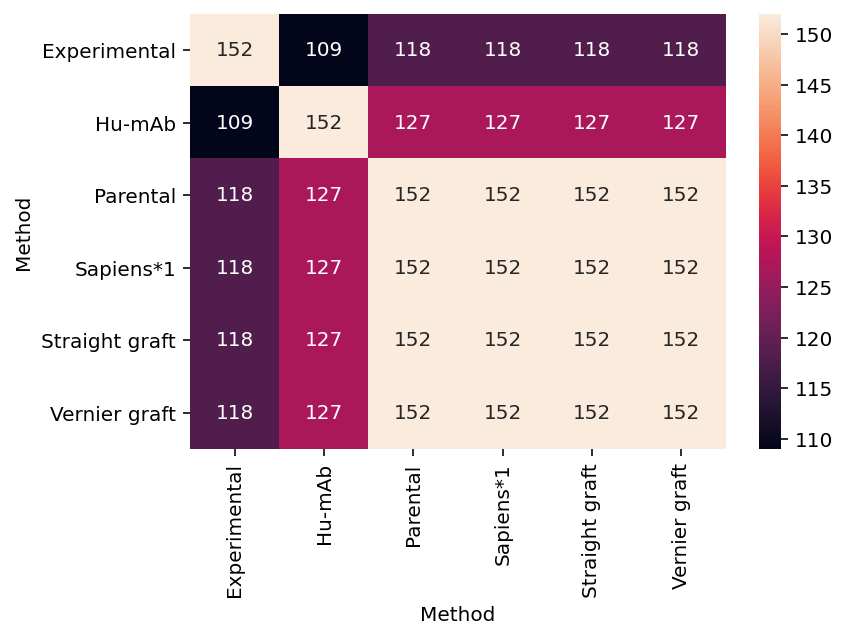

In [46]:
heavy_family_agreement = heavy_families.apply(lambda col1: heavy_families.apply(lambda col2: col2 == col1).sum())
sns.heatmap(heavy_family_agreement, annot=True, fmt='.0f');

In [47]:
light_families = germline_families.set_index(['Antibody','Method'])['Light V Family'].unstack()
light_families.head()

Method,Experimental,Hu-mAb,Parental,Sapiens*1,Straight graft,Vernier graft
Antibody,,,,,,
Abituzumab,IGKV1,IGKV1,IGKV1,IGKV1,IGKV1,IGKV1
Afutuzumab,IGKV2,IGKV2,IGKV2,IGKV2,IGKV2,IGKV2
Alacizumab,IGKV1,IGKV1,IGKV1,IGKV1,IGKV1,IGKV1
Alemtuzumab,IGKV1,IGKV1,IGKV1,IGKV1,IGKV1,IGKV1
Anrukinzumab,IGKV1,IGKV7,IGKV7,IGKV7,IGKV7,IGKV7


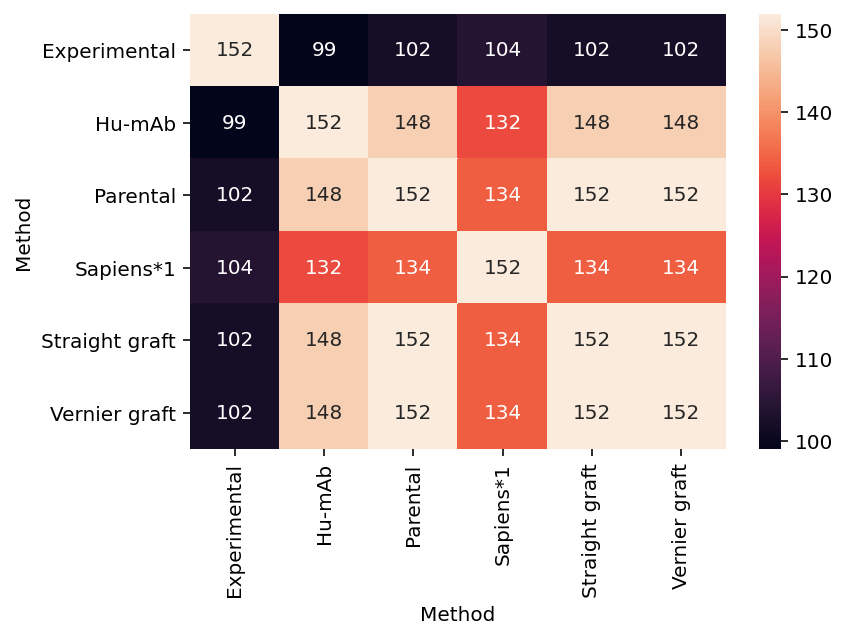

In [48]:
light_family_agreement = light_families.apply(lambda col1: light_families.apply(lambda col2: col2 == col1).sum())
sns.heatmap(light_family_agreement, annot=True, fmt='.0f');

In [51]:
heavy_genes = germline_families.set_index(['Antibody','Method'])['Heavy V Gene'].unstack()
heavy_genes.head()

Method,Experimental,Hu-mAb,Parental,Sapiens*1,Straight graft,Vernier graft
Antibody,,,,,,
Abituzumab,IGHV1-46,IGHV1-46,IGHV1-46,IGHV1-46,IGHV1-46,IGHV1-46
Afutuzumab,IGHV1-69,IGHV1-69,IGHV1-69,IGHV1-69,IGHV1-69,IGHV1-69
Alacizumab,IGHV3-7,IGHV3-NL1,IGHV3-7,IGHV3-7,IGHV3-7,IGHV3-7
Alemtuzumab,IGHV4-30-4,IGHV3-71,IGHV3-71,IGHV3-71,IGHV3-71,IGHV3-71
Anrukinzumab,IGHV3/OR16-10,IGHV1-3,IGHV3-21,IGHV3-21,IGHV3-21,IGHV3-21


In [56]:
for col in heavy_genes.columns:
    print(col, 'most used:')
    print(heavy_genes[col].value_counts().head())
    print('')

Experimental most used:
IGHV1-46     25
IGHV3-23     22
IGHV1-2      15
IGHV1-69     14
IGHV7-4-1     8
Name: Experimental, dtype: int64

Hu-mAb most used:
IGHV1-2      35
IGHV1-46     27
IGHV1-69      9
IGHV3-30      8
IGHV7-4-1     8
Name: Hu-mAb, dtype: int64

Parental most used:
IGHV1-2      28
IGHV1-46     25
IGHV1-3      14
IGHV7-4-1    14
IGHV3-23      9
Name: Parental, dtype: int64

Sapiens*1 most used:
IGHV1-46     34
IGHV1-2      28
IGHV7-4-1    14
IGHV1-3      11
IGHV3-23      9
Name: Sapiens*1, dtype: int64

Straight graft most used:
IGHV1-2      28
IGHV1-46     25
IGHV1-3      14
IGHV7-4-1    14
IGHV3-23      9
Name: Straight graft, dtype: int64

Vernier graft most used:
IGHV1-2      28
IGHV1-46     25
IGHV1-3      14
IGHV7-4-1    14
IGHV3-23      9
Name: Vernier graft, dtype: int64



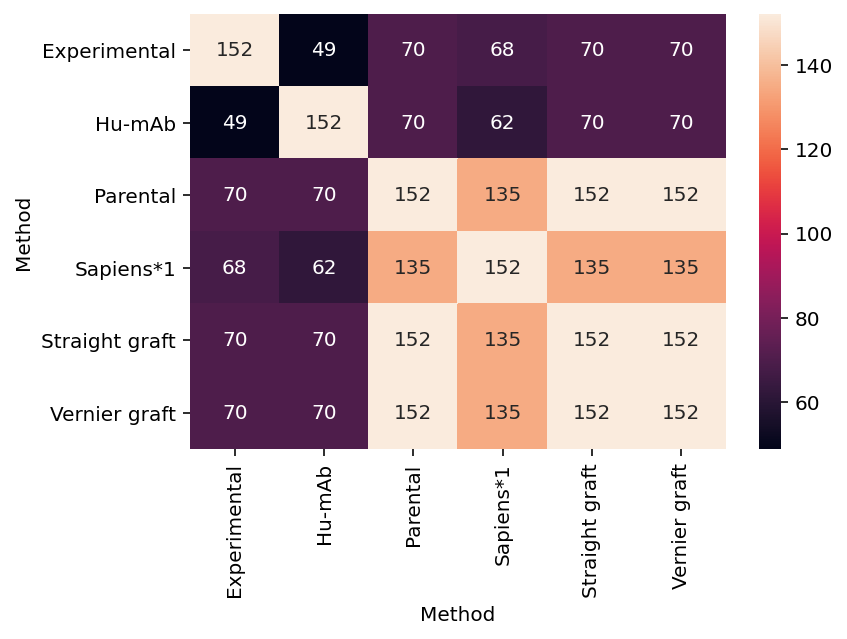

In [52]:
heavy_gene_agreement = heavy_genes.apply(lambda col1: heavy_genes.apply(lambda col2: col2 == col1).sum())
sns.heatmap(heavy_gene_agreement, annot=True, fmt='.0f');

In [54]:
light_genes = germline_families.set_index(['Antibody','Method'])['Light V Gene'].unstack()
light_genes.head()

Method,Experimental,Hu-mAb,Parental,Sapiens*1,Straight graft,Vernier graft
Antibody,,,,,,
Abituzumab,IGKV1-33,IGKV1-27,IGKV1-27,IGKV1-16,IGKV1-27,IGKV1-27
Afutuzumab,IGKV2-28,IGKV2D-28,IGKV2-28,IGKV2-28,IGKV2-28,IGKV2-28
Alacizumab,IGKV1-16,IGKV1/OR2-2,IGKV1-16,IGKV1-39,IGKV1-16,IGKV1-16
Alemtuzumab,IGKV1-33,IGKV1D-39,IGKV1-39,IGKV1-39,IGKV1-39,IGKV1-39
Anrukinzumab,IGKV1-39,IGKV7-3,IGKV7-3,IGKV7-3,IGKV7-3,IGKV7-3


In [57]:
for col in light_genes.columns:
    print(col, 'most used:')
    print(light_genes[col].value_counts().head())
    print('')

Experimental most used:
IGKV1-39    51
IGKV1-33    19
IGKV4-1     16
IGKV3-11    10
IGKV2-28     9
Name: Experimental, dtype: int64

Hu-mAb most used:
IGKV7-3      22
IGKV4-1      14
IGKV2-30     14
IGKV1D-39    12
IGKV1D-33    12
Name: Hu-mAb, dtype: int64

Parental most used:
IGKV7-3     22
IGKV1-39    15
IGKV4-1     14
IGKV1-33    14
IGKV1-27    11
Name: Parental, dtype: int64

Sapiens*1 most used:
IGKV1-39    26
IGKV4-1     22
IGKV1-33    17
IGKV7-3     12
IGKV3-11    12
Name: Sapiens*1, dtype: int64

Straight graft most used:
IGKV7-3     22
IGKV1-39    15
IGKV4-1     14
IGKV1-33    14
IGKV1-27    11
Name: Straight graft, dtype: int64

Vernier graft most used:
IGKV7-3     22
IGKV1-39    15
IGKV4-1     14
IGKV1-33    14
IGKV1-27    11
Name: Vernier graft, dtype: int64



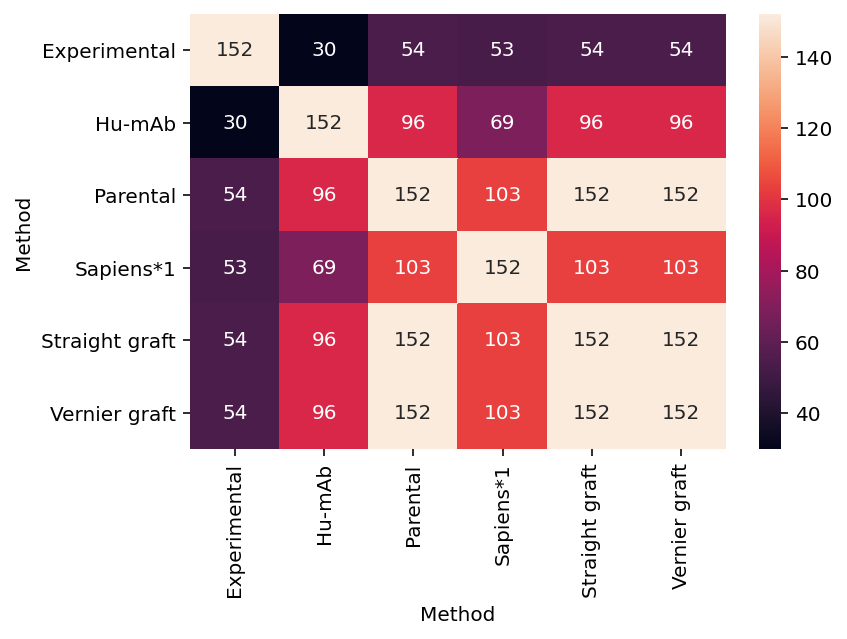

In [55]:
light_gene_agreement = light_genes.apply(lambda col1: light_genes.apply(lambda col2: col2 == col1).sum())
sns.heatmap(light_gene_agreement, annot=True, fmt='.0f');

# Preservation

In [16]:
def get_mean_conservation(positions, groupby, methods=None):
    conservation = positions.groupby(groupby)['conservation'].value_counts(normalize=True)
    conservation = conservation.unstack().fillna(0)
    conservation.columns.name = None
    return conservation

In [17]:
def conservation_barplot(conservation, rows=1, figsize=(12, 3), methods=None, axes=None):
    with sns.axes_style('whitegrid'):
        num_plots = conservation.index.get_level_values(0).nunique()
        cols = int(np.ceil(num_plots / rows))
        fig = None
        if axes is None:
            fig, axes = plt.subplots(rows, cols, figsize=figsize, sharey=True)
        for i, (title, values) in enumerate(conservation.groupby(level=0, sort=False)):
            values = values.reset_index().set_index('Method')
            assert values.index.is_unique, 'Expected one row for Method'
            if methods is not None:
                values = values.loc[methods]
            color = [COLORS[name] for name in values.index]
            ax = axes.flatten()[i]
            ax.bar(values.index, values['Conserved'], hatch='////', linewidth=0, color=color, alpha=0.8)
            ax.bar(values.index, values['Back-mutated'], linewidth=0, bottom=values['Conserved'], color=color)
            ax.set_xticks(values.index)
            ax.set_xticklabels(values.index, rotation=90)
            ax.set_title(title.replace(' ','\n'))
            #ax.set_xticks([])
            ax.set_ylim(0, 1.04)
            if i % cols == 0:
                ax.set_ylabel('Preservation');
            ax.set_yticks(np.arange(0, 1.01, 0.2))
            ax.set_yticklabels('{:.0%}'.format(v) for v in ax.get_yticks())
        if fig is not None:
            fig.tight_layout(h_pad=2);

In [18]:
pos_conservation = get_mean_conservation(
    positions, 
    groupby=['pos','Chain','Method']
)
pos_conservation.head()

Back-mutated  Conserved  Engineered  Humanized
pos Chain Method                                                        
H1  Heavy Experimental        0.072368   0.743421    0.032895   0.151316
          Hu-mAb              0.072368   0.631579    0.026316   0.269737
          Parental            0.230263   0.769737    0.000000   0.000000
          Sapiens*1           0.072368   0.763158    0.006579   0.157895
          Straight graft      0.000000   0.769737    0.000000   0.230263

In [19]:
region_labels = positions['Chain'] + ' ' + positions['region']
region_conservation = get_mean_conservation(
    positions, 
    groupby=[region_labels,'Method']
).loc[region_labels.unique()]
region_conservation.head()

Back-mutated  Conserved  Engineered  Humanized
          Method                                                        
Heavy FR1 Experimental        0.044737   0.753509    0.017544   0.184211
          Hu-mAb              0.103947   0.747807    0.041447   0.106798
          Parental            0.187281   0.812719    0.000000   0.000000
          Sapiens*1           0.063816   0.812500    0.002412   0.121272
          Straight graft      0.000000   0.812719    0.000658   0.186623

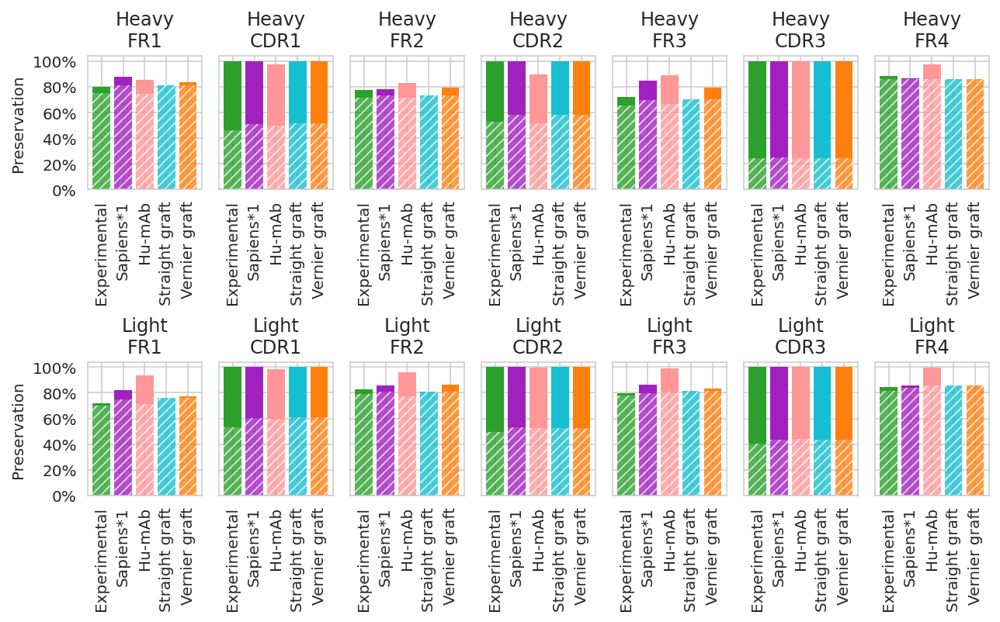

In [20]:
conservation_barplot(
    region_conservation, 
    rows=2, 
    methods=HUMANIZED_METHOD_NAMES,
    figsize=(9, 5.5)
)

In [21]:
vernier_positions = positions[positions['in_vernier']]

In [22]:
pos_labels = vernier_positions['region'] + ' ' + vernier_positions['pos']
vernier_conservation = get_mean_conservation(
    vernier_positions, 
    groupby=[pos_labels,'Chain','Method']
)
vernier_conservation.head()

Back-mutated  Conserved  Engineered  Humanized
       Chain Method                                                        
FR1 H2 Heavy Experimental        0.006579   0.894737    0.000000   0.098684
             Hu-mAb              0.078947   0.875000    0.026316   0.019737
             Parental            0.105263   0.894737    0.000000   0.000000
             Sapiens*1           0.000000   0.894737    0.000000   0.105263
             Straight graft      0.000000   0.894737    0.000000   0.105263

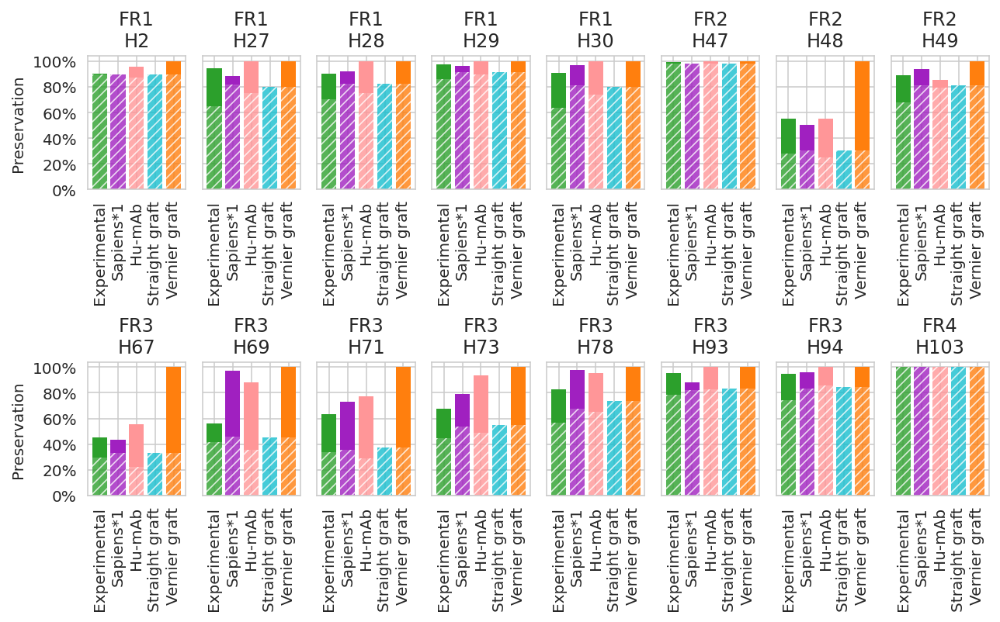

In [23]:
conservation_barplot(
    vernier_conservation[vernier_conservation.index.get_level_values('Chain') == 'Heavy'], 
    rows=2,
    methods=HUMANIZED_METHOD_NAMES,
    figsize=(9, 5.5)
)

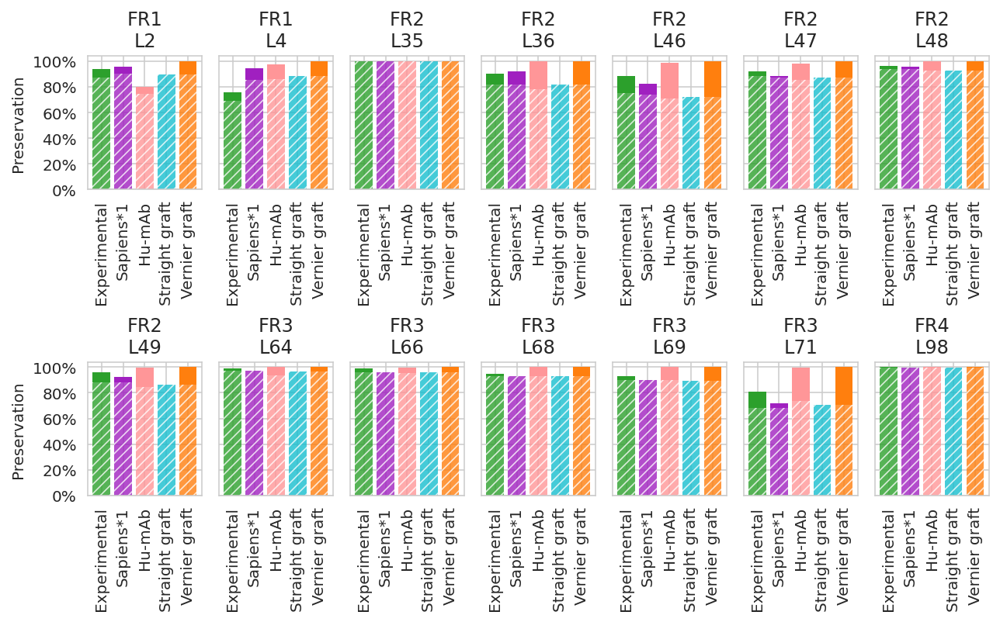

In [24]:
conservation_barplot(
    vernier_conservation[vernier_conservation.index.get_level_values('Chain') == 'Light'], 
    rows=2,
    methods=HUMANIZED_METHOD_NAMES,
    figsize=(9, 5.5)
)

In [25]:
chain_conservation = get_mean_conservation(
    positions, 
    groupby=['Chain','Method']
)
chain_conservation.apply(lambda col: col.apply('{:.0%}'.format))

Back-mutated Conserved Engineered Humanized
Chain Method                                                    
Heavy Experimental            19%       65%         2%       15%
      Hu-mAb                  25%       65%         3%        8%
      Parental                32%       68%         0%        0%
      Sapiens*1               21%       68%         0%       11%
      Straight graft          14%       68%         0%       17%
      Vernier graft           18%       68%         0%       13%
Light Experimental            15%       69%         1%       15%
      Hu-mAb                  26%       71%         2%        0%
      Parental                27%       73%         0%        0%
      Sapiens*1               17%       72%         1%       10%
      Straight graft          12%       73%         0%       14%
      Vernier graft           14%       73%         0%       13%

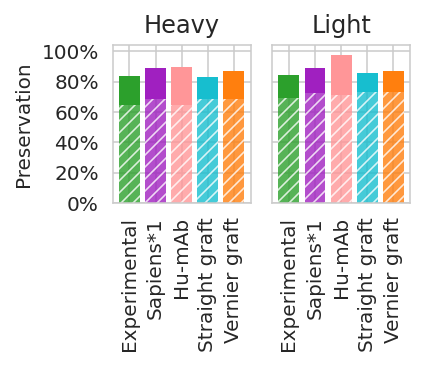

In [26]:
conservation_barplot(
    chain_conservation,
    methods=HUMANIZED_METHOD_NAMES,
    figsize=(3, 2.5)
)

In [27]:
vernier_chain_conservation = get_mean_conservation(
    vernier_positions, 
    groupby=['Chain','Method']
)
vernier_chain_conservation.apply(lambda col: col.apply('{:.0%}'.format))

Back-mutated Conserved Engineered Humanized
Chain Method                                                    
Heavy Experimental            18%       64%         4%       14%
      Hu-mAb                  23%       67%         3%        6%
      Parental                28%       72%         0%        0%
      Sapiens*1               15%       71%         0%       13%
      Straight graft           0%       72%         0%       28%
      Vernier graft           28%       72%         0%        0%
Light Experimental             5%       88%         1%        7%
      Hu-mAb                  11%       87%         2%        0%
      Parental                11%       89%         0%        0%
      Sapiens*1                3%       89%         0%        8%
      Straight graft           0%       89%         0%       11%
      Vernier graft           11%       89%         0%        0%

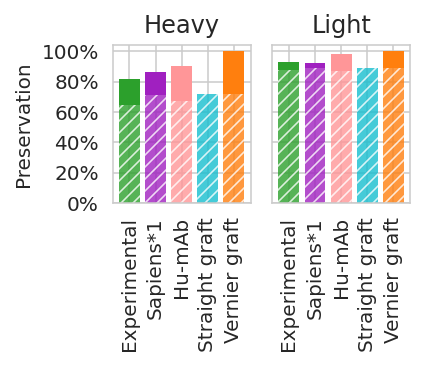

In [28]:
conservation_barplot(
    vernier_chain_conservation, 
    methods=HUMANIZED_METHOD_NAMES,
    figsize=(3, 2.5)
)

# Humanizing mutations overlap

In [60]:
baseline_residues = positions[positions['Method'] == EXPERIMENTAL['name']].set_index(['name','pos'])['predicted'].rename('baseline')
positions_with_baseline = positions.copy()
positions_with_baseline['baseline'] = positions_with_baseline[['name','pos']].apply(tuple, axis=1).apply(baseline_residues.to_dict().get)
positions_with_baseline.head()

,Method,Chain,name,pos,chain,region,in_vernier,parental,predicted,germline,conservation,baseline
0,Parental,Heavy,Abituzumab,H1,Heavy,FR1,False,Q,Q,Q,Conserved,Q
1,Parental,Heavy,Abituzumab,H2,Heavy,FR1,True,V,V,V,Conserved,V
2,Parental,Heavy,Abituzumab,H3,Heavy,FR1,False,Q,Q,Q,Conserved,Q
3,Parental,Heavy,Abituzumab,H4,Heavy,FR1,False,L,L,L,Conserved,L
4,Parental,Heavy,Abituzumab,H5,Heavy,FR1,False,Q,Q,V,Back-mutated,Q


In [61]:
accuracy = positions_with_baseline.groupby('Method').apply(lambda rows: (rows['predicted'] == rows['baseline']).mean())
accuracy.apply('{:.1%}'.format)

Method
Experimental      100.0%
Hu-mAb             83.2%
Parental           84.0%
Sapiens*1          90.2%
Straight graft     90.4%
Vernier graft      90.8%
dtype: object

In [62]:
vernier_accuracy = positions_with_baseline[positions_with_baseline['in_vernier']].groupby('Method').apply(lambda rows: (rows['predicted'] == rows['baseline']).mean())
vernier_accuracy.apply('{:.1%}'.format)

Method
Experimental      100.0%
Hu-mAb             85.2%
Parental           87.0%
Sapiens*1          87.7%
Straight graft     84.0%
Vernier graft      87.0%
dtype: object

In [63]:
mutations = positions_with_baseline.copy()
mutations = mutations[(mutations['parental'] != mutations['predicted']) | (mutations['parental'] != mutations['baseline'])]
mutations.head()

,Method,Chain,name,pos,chain,region,in_vernier,parental,predicted,germline,conservation,baseline
8,Parental,Heavy,Abituzumab,H9,Heavy,FR1,False,A,A,A,Conserved,G
19,Parental,Heavy,Abituzumab,H20,Heavy,FR1,False,L,L,V,Back-mutated,V
29,Parental,Heavy,Abituzumab,H30,Heavy,FR1,True,T,T,T,Conserved,S
37,Parental,Heavy,Abituzumab,H38,Heavy,FR2,False,K,K,R,Back-mutated,R
39,Parental,Heavy,Abituzumab,H40,Heavy,FR2,False,R,R,A,Back-mutated,A


In [64]:
def get_mutation_overlap(positions):
    agreeing = positions['predicted'] == positions['baseline']
    return pd.Series({
        'Baseline only': (~agreeing & (positions['parental'] != positions['baseline'])).sum(),
        'Shared': agreeing.sum(),
        'Predicted only': (~agreeing & (positions['parental'] != positions['predicted'])).sum(),
    })

In [65]:
overlap = mutations.groupby(['Method','name']).apply(get_mutation_overlap)
overlap.head()

Baseline only  Shared  Predicted only
Method       name                                               
Experimental Abituzumab                0      30               0
             Afutuzumab                0      28               0
             Alacizumab                0      28               0
             Alemtuzumab               0      58               0
             Anrukinzumab              0      34               0

In [66]:
vernier_overlap = mutations[mutations['in_vernier']].groupby(['Method','name']).apply(get_mutation_overlap)
vernier_overlap.head()

Baseline only  Shared  Predicted only
Method       name                                               
Experimental Abituzumab                0       5               0
             Afutuzumab                0       3               0
             Alacizumab                0       1               0
             Alemtuzumab               0       8               0
             Anrukinzumab              0       3               0

In [67]:
mean_overlap = overlap.groupby(level=0).mean()
mean_overlap

,Baseline only,Shared,Predicted only
Method,,,
Experimental,0.000000,36.493421,0.000000
Hu-mAb,31.019737,5.473684,9.546053
Parental,36.493421,0.000000,0.000000
Sapiens*1,18.197368,18.296053,7.000000
Straight graft,13.296053,23.197368,12.980263
Vernier graft,15.526316,20.967105,9.085526


In [68]:
precision = mean_overlap['Shared'] / mean_overlap[['Shared','Predicted only']].sum(axis=1)
precision.apply('{:.1%}'.format)

Method
Experimental      100.0%
Hu-mAb             36.4%
Parental            nan%
Sapiens*1          72.3%
Straight graft     64.1%
Vernier graft      69.8%
dtype: object

In [69]:
mean_vernier_overlap = vernier_overlap.groupby(level=0).mean()
mean_vernier_overlap

,Baseline only,Shared,Predicted only
Method,,,
Experimental,0.000000,4.146853,0.000000
Hu-mAb,3.486667,0.466667,1.380000
Parental,4.146853,0.000000,0.000000
Sapiens*1,2.353333,1.600000,1.766667
Straight graft,1.671053,2.230263,3.894737
Vernier graft,4.146853,0.000000,0.000000


In [70]:
vernier_precision = mean_vernier_overlap['Shared'] / mean_vernier_overlap[['Shared','Predicted only']].sum(axis=1)
vernier_precision.apply('{:.1%}'.format)

Method
Experimental      100.0%
Hu-mAb             25.3%
Parental            nan%
Sapiens*1          47.5%
Straight graft     36.4%
Vernier graft       nan%
dtype: object

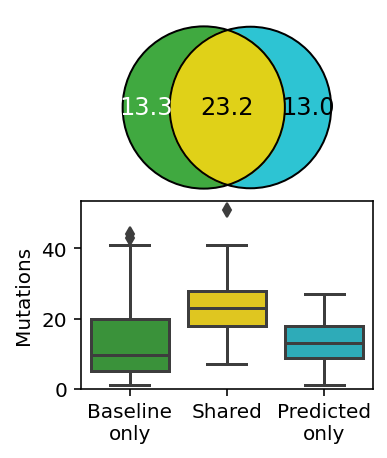

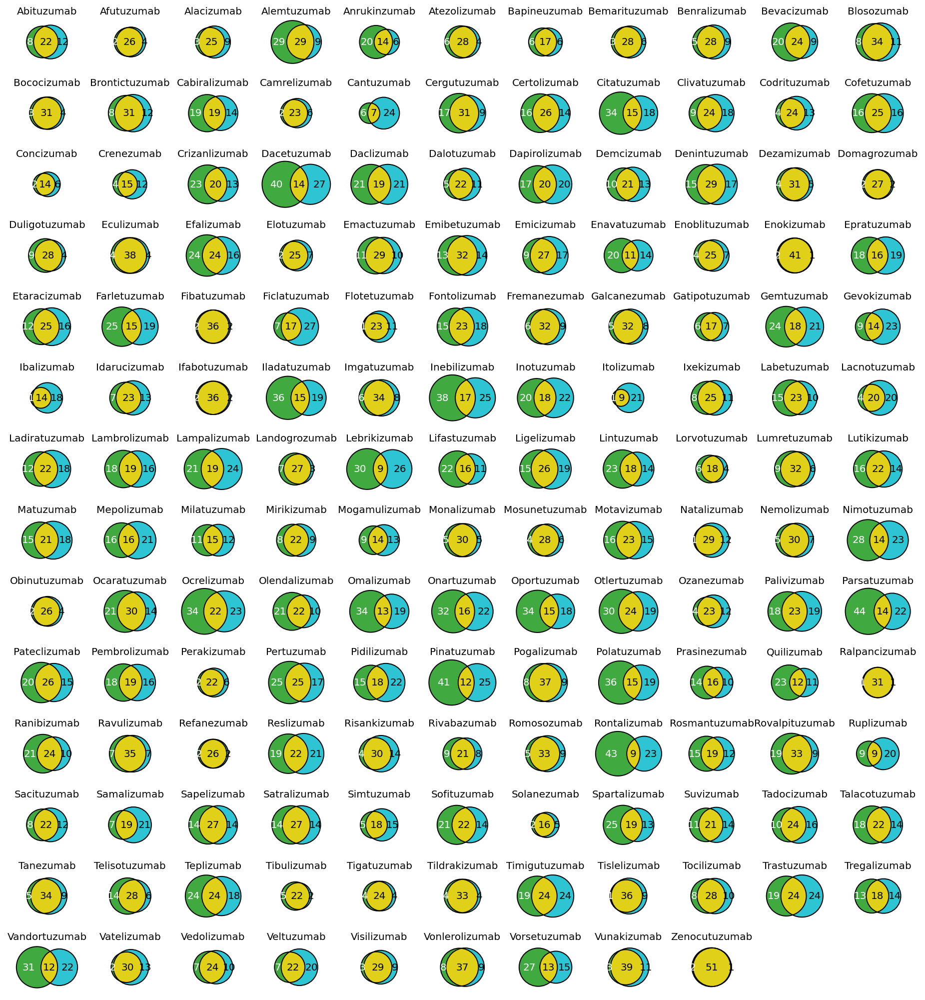

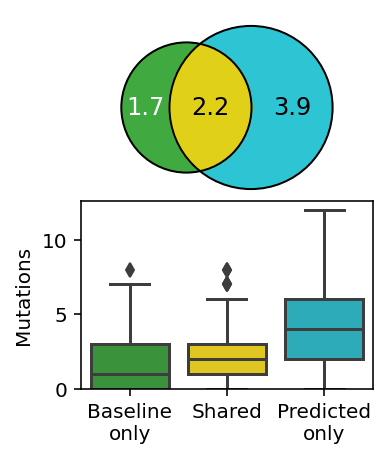

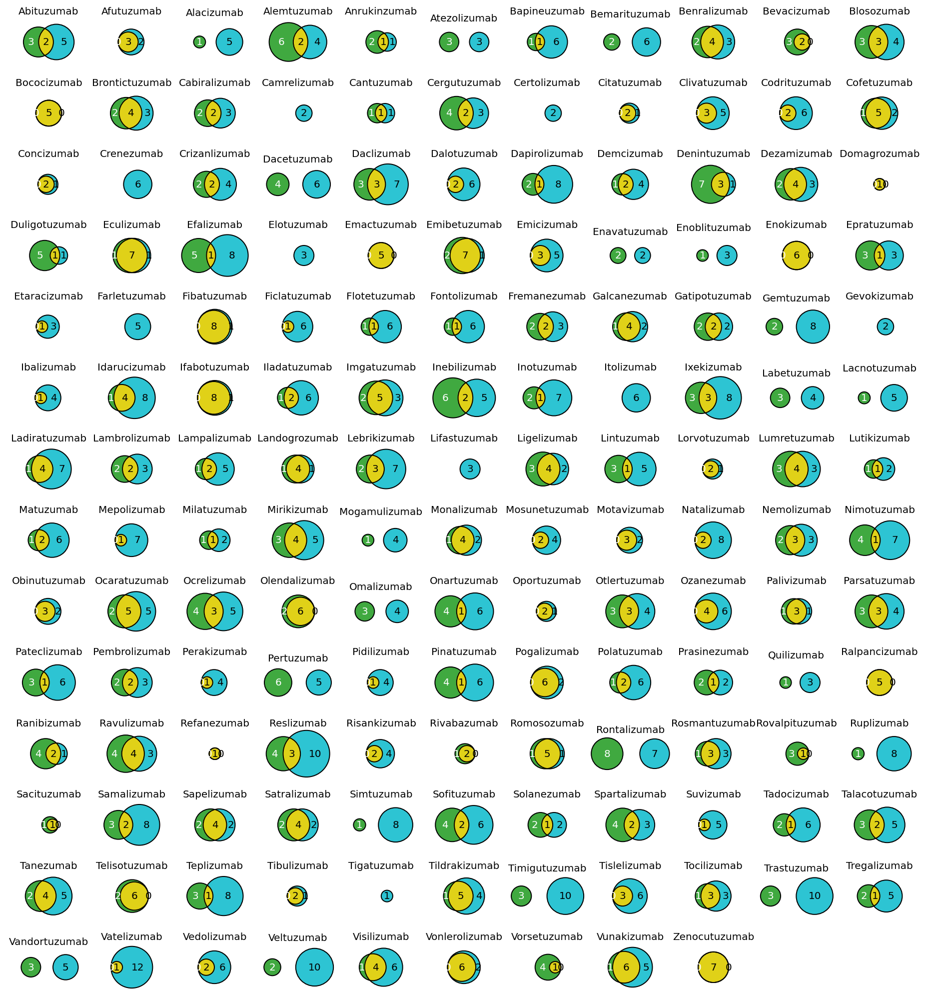

In [71]:
name = STRAIGHT_GRAFT['name']
colors = {
    'Baseline': COLORS['Experimental'],
    'Prediction': COLORS[name]
}
heading('Total overlap')
plot_overlap(overlap.loc[name], colors=colors, predicted_label_color='black')
plt.show()
plot_overlap_venns(overlap.loc[name], colors=colors, rows=14, cols=11, figsize=(13, 14), predicted_label_color='black')
plt.show()
heading('Vernier overlap')
plot_overlap(vernier_overlap.loc[name], colors=colors, predicted_label_color='black')
plt.show()
plot_overlap_venns(vernier_overlap.loc[name], colors=colors, rows=14, cols=11, figsize=(13, 14), predicted_label_color='black')
plt.show()

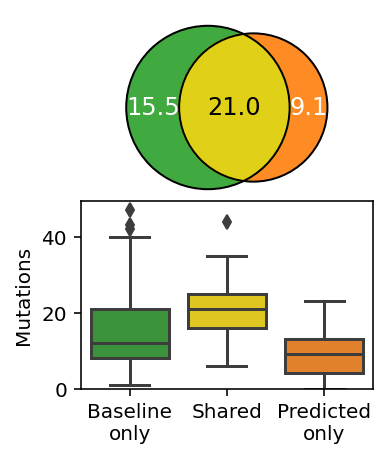

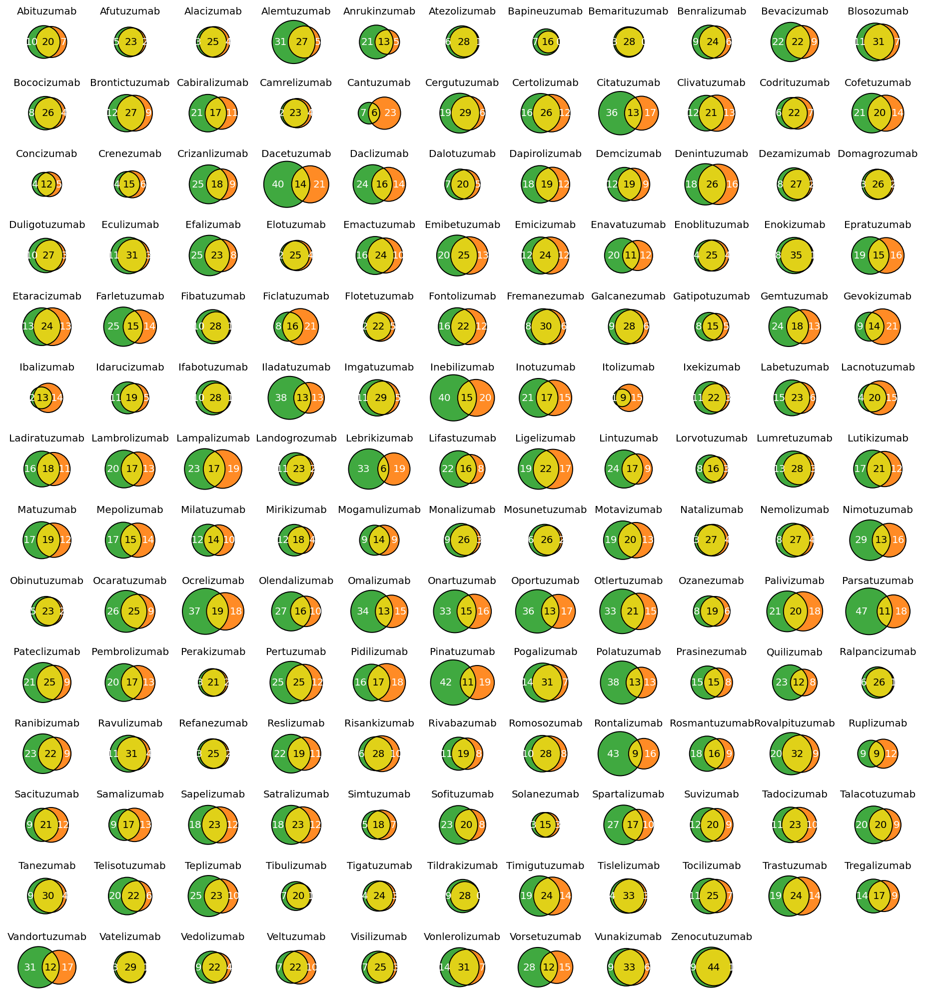

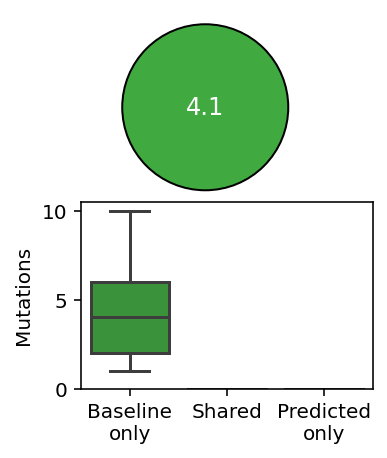

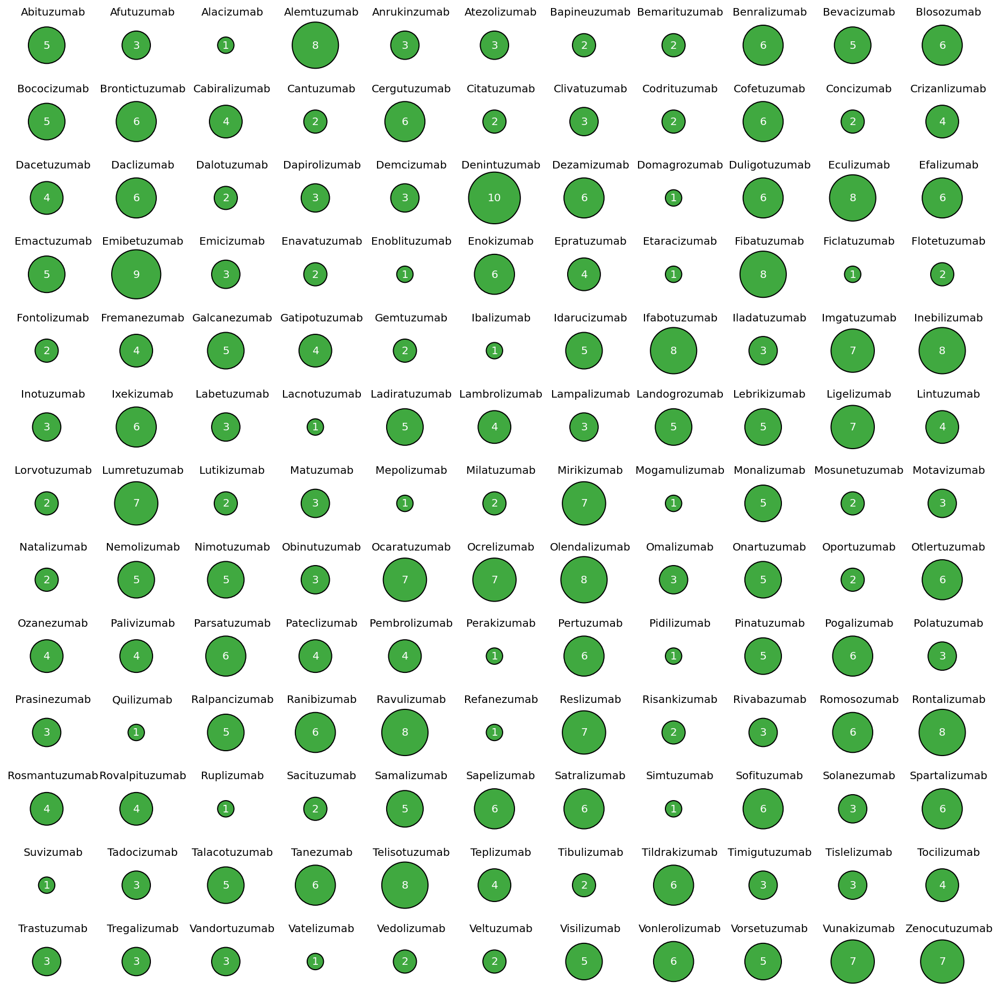

In [72]:
name = VERNIER_GRAFT['name']
colors = {
    'Baseline': COLORS['Experimental'],
    'Prediction': COLORS[name]
}
heading('Total overlap')
plot_overlap(overlap.loc[name], colors=colors)
plt.show()
plot_overlap_venns(overlap.loc[name], colors=colors, rows=14, cols=11, figsize=(13, 14))
plt.show()
heading('Vernier overlap')
plot_overlap(vernier_overlap.loc[name], colors=colors)
plt.show()
plot_overlap_venns(vernier_overlap.loc[name], colors=colors, rows=14, cols=11, figsize=(13, 14))
plt.show()

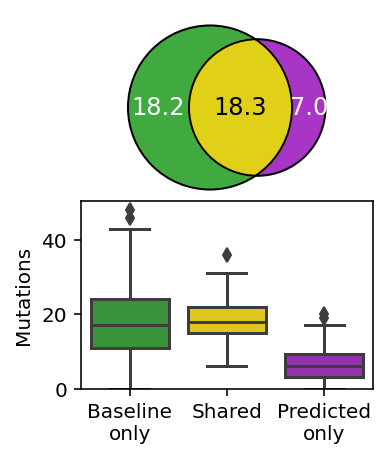

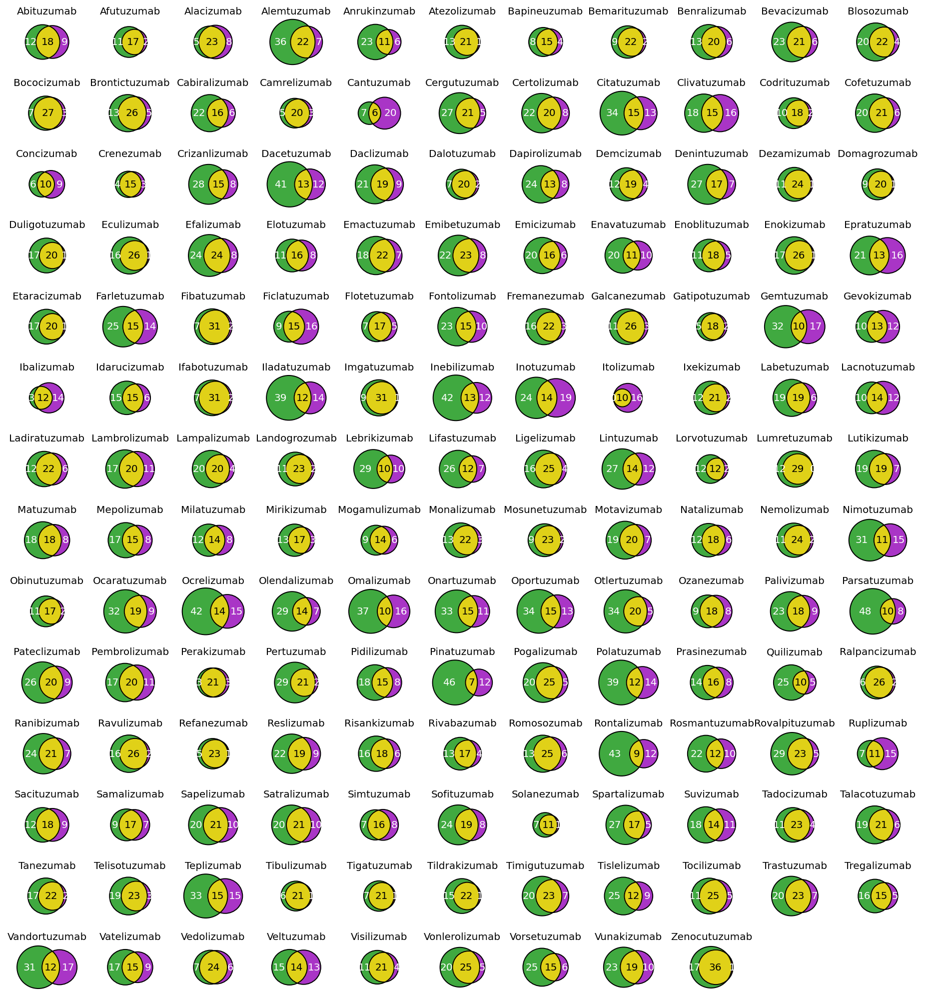

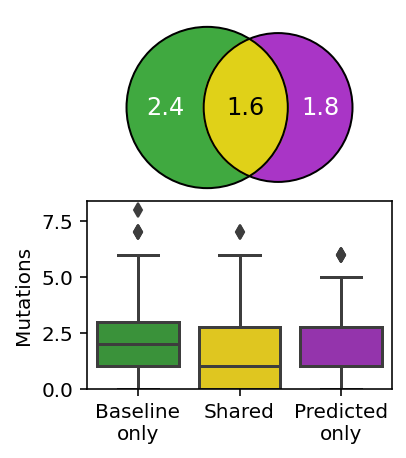

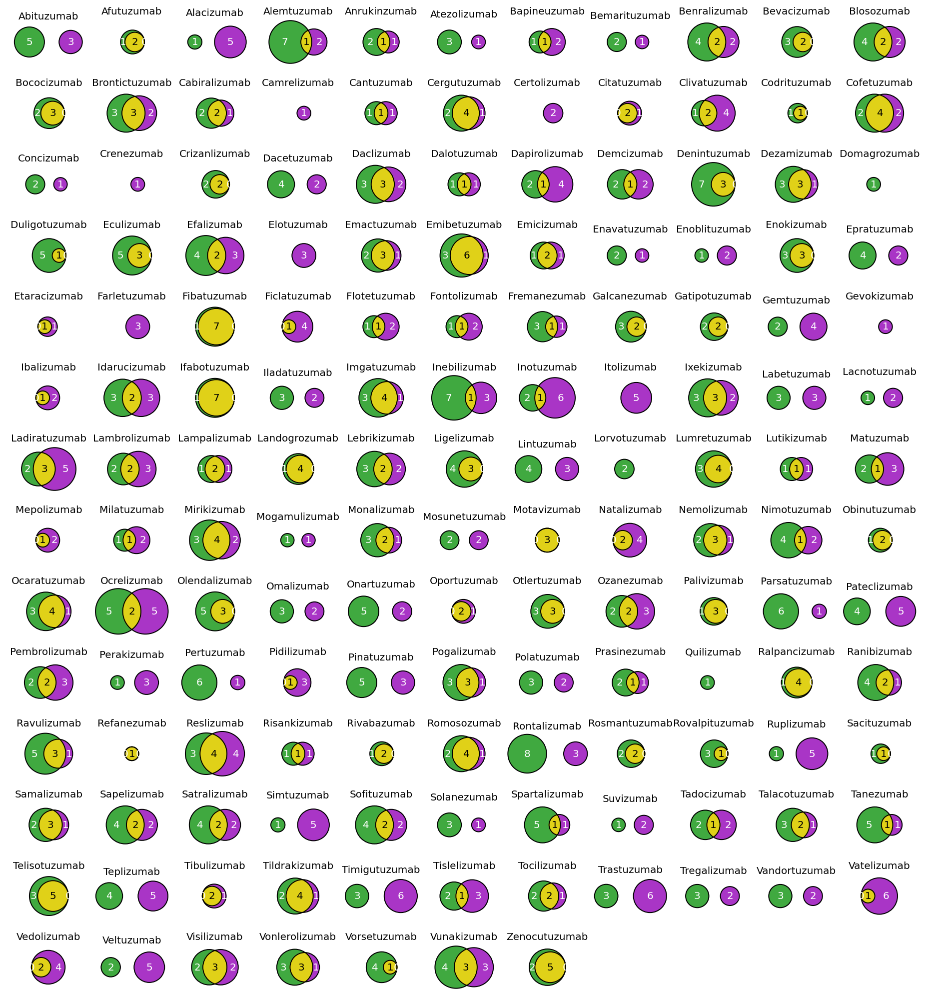

In [73]:
name = SAPIENS['name']
colors = {
    'Baseline': COLORS['Experimental'],
    'Prediction': COLORS[name]
}
heading('Total overlap')
plot_overlap(overlap.loc[name], colors=colors)
plt.show()
plot_overlap_venns(overlap.loc[name], colors=colors, rows=14, cols=11, figsize=(13, 14))
plt.show()
heading('Vernier overlap')
plot_overlap(vernier_overlap.loc[name], colors=colors)
plt.show()
plot_overlap_venns(vernier_overlap.loc[name], colors=colors, rows=14, cols=11, figsize=(13, 14))
plt.show()

In [74]:
sapiens_overlap = overlap.loc[SAPIENS['name']]
sapiens_overlap[sapiens_overlap.sum(axis=1) - sapiens_overlap['Shared'] <= 7]

,Baseline only,Shared,Predicted only
name,,,
Crenezumab,4,15,3
Gatipotuzumab,5,18,2
Perakizumab,3,21,3
Refanezumab,5,23,1
Tibulizumab,6,21,1


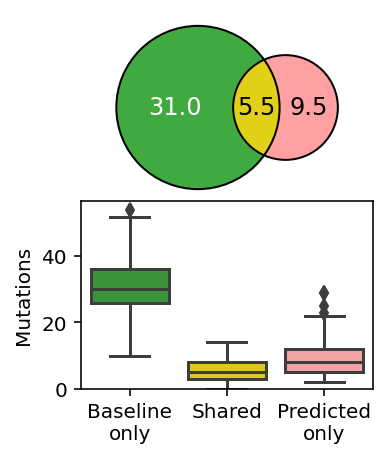

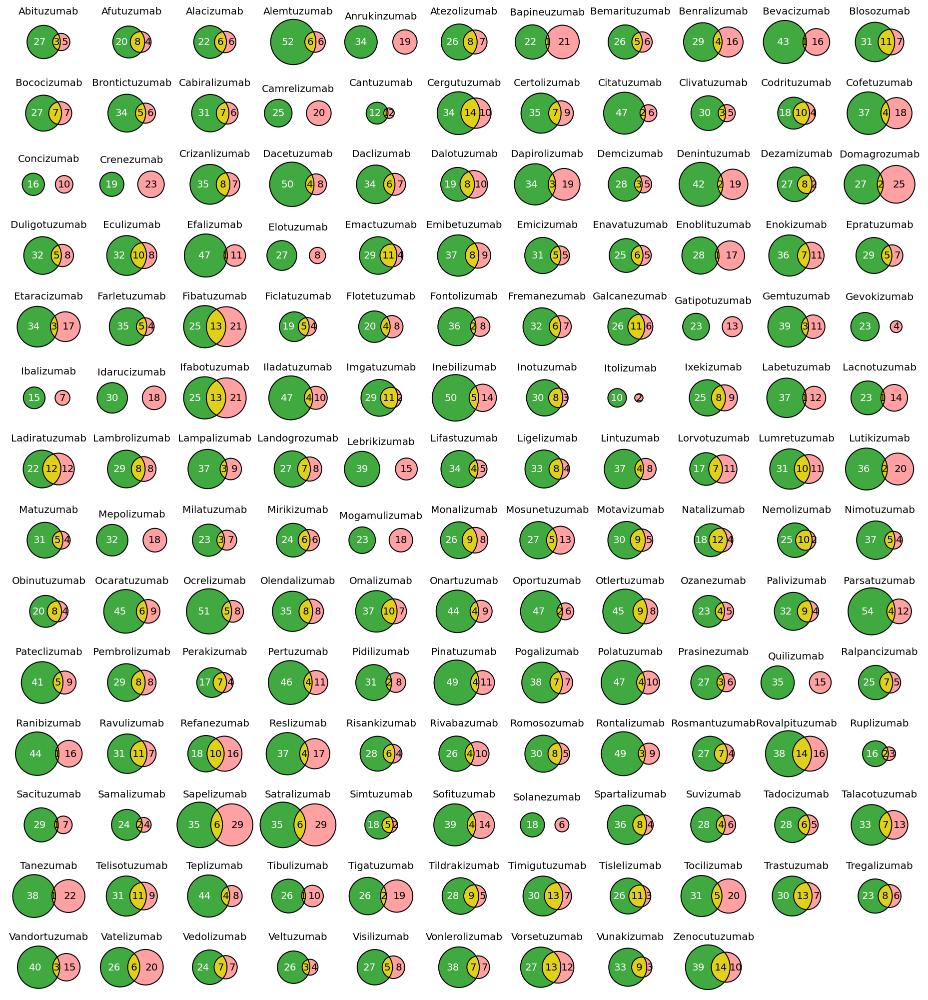

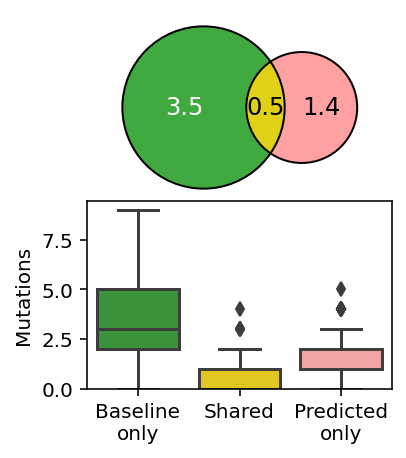

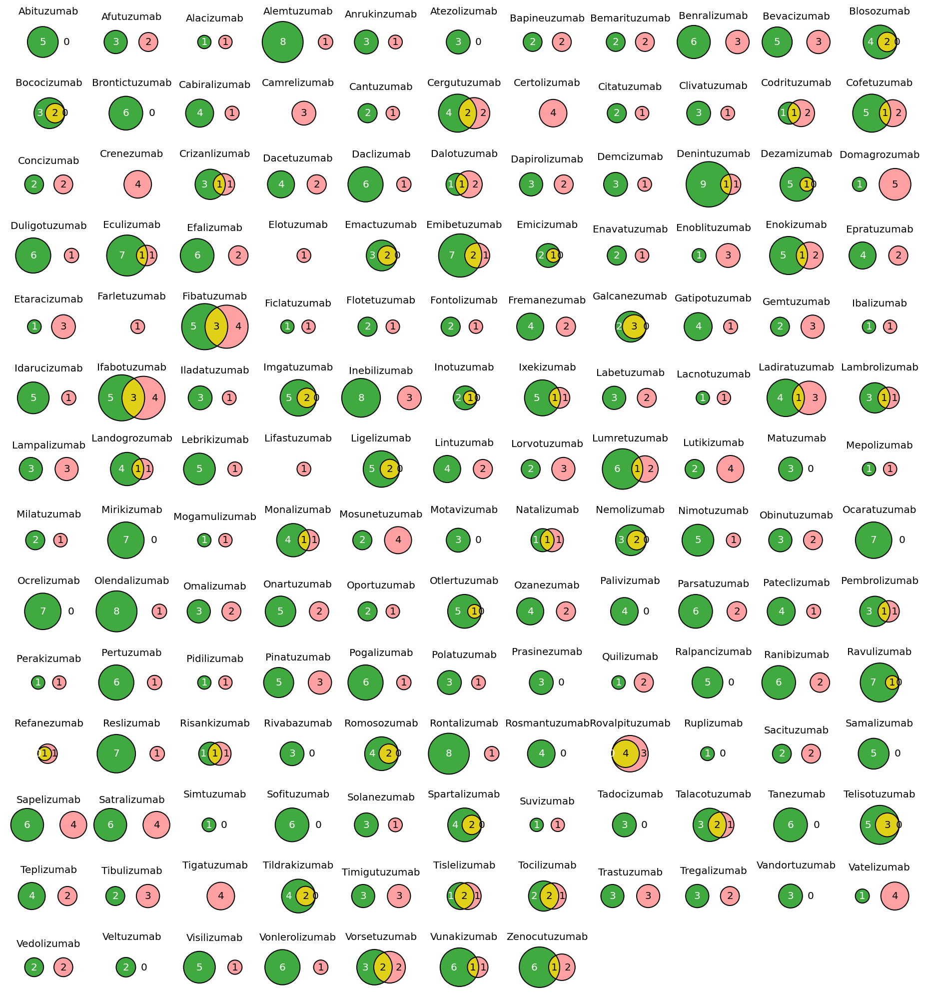

In [44]:
name = HUMAB['name']
colors = {
    'Baseline': COLORS['Experimental'],
    'Prediction': COLORS[name]
}
heading('Total overlap')
plot_overlap(overlap.loc[name], colors=colors, predicted_label_color='black')
plt.show()
plot_overlap_venns(overlap.loc[name], colors=colors, rows=14, cols=11, figsize=(13, 14), predicted_label_color='black')
plt.show()
heading('Vernier overlap')
plot_overlap(vernier_overlap.loc[name], colors=colors, predicted_label_color='black')
plt.show()
plot_overlap_venns(vernier_overlap.loc[name], colors=colors, rows=14, cols=11, figsize=(13, 14), predicted_label_color='black')
plt.show()

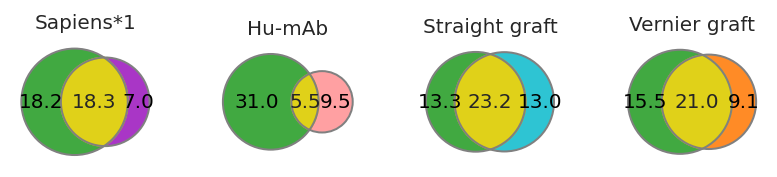

In [45]:
with sns.axes_style('whitegrid'):
    fig, axes = plt.subplots(1, 4, figsize=(5.5, 2.5))
    for i, name in enumerate([SAPIENS['name'], HUMAB['name'], STRAIGHT_GRAFT['name'], VERNIER_GRAFT['name']]):
        colors = {
            'Baseline': COLORS['Experimental'],
            'Prediction': COLORS[name]
        }
        plot_overlap_venn(overlap.loc[name].mean(), colors=colors, fontsize=10, outline='grey',
                          baseline_label_color='black', predicted_label_color='black', ax=axes[i])
        axes[i].set_title(name, fontsize=10)
    fig.tight_layout(w_pad=3);
    fig.savefig('../../data/figures/main/fig6d.pdf', bbox_inches='tight')

In [46]:
def get_conservation_flags(positions):
    positions = positions.set_index('Method', verify_integrity=True)
    return (positions['parental'] == positions['germline']).reindex(HUMANIZED_METHOD_NAMES, fill_value=False)

def get_mutated_flags(positions):
    positions = positions.set_index('Method', verify_integrity=True)
    return (positions['parental'] != positions['predicted']).reindex(HUMANIZED_METHOD_NAMES, fill_value=False)

In [47]:
vernier_conserved_flags = vernier_positions.groupby(['name','pos']).apply(get_conservation_flags)
vernier_conserved_flags.head()

Method           Experimental  Sapiens*1  Hu-mAb  Straight graft  \
name       pos                                                     
Abituzumab H103          True       True    True            True   
           H2            True       True    True            True   
           H27           True       True    True            True   
           H28           True       True    True            True   
           H29           True       True    True            True   

Method           Vernier graft  
name       pos                  
Abituzumab H103           True  
           H2             True  
           H27            True  
           H28            True  
           H29            True

In [48]:
vernier_mutated_flags = vernier_positions.groupby(['name','pos']).apply(get_mutated_flags)
vernier_mutated_flags.head()

Method           Experimental  Sapiens*1  Hu-mAb  Straight graft  \
name       pos                                                     
Abituzumab H103         False      False   False           False   
           H2           False      False   False           False   
           H27          False      False   False           False   
           H28          False      False   False           False   
           H29          False      False   False           False   

Method           Vernier graft  
name       pos                  
Abituzumab H103          False  
           H2            False  
           H27           False  
           H28           False  
           H29           False

In [49]:
def get_contingency_matrix(mutated_flags, conserved_flags, names):
    # select only positions that are not conserved between parent and human germline (in both the first and second sequence)
    mutated_flags = mutated_flags[~conserved_flags[names[0]] & ~conserved_flags[names[1]]]

    first = mutated_flags[names[0]]
    second = mutated_flags[names[1]]
    mutated_both = (first & second).sum()
    mutated_first_only = (first & ~second).sum()
    mutated_second_only = (~first & second).sum()
    mutated_none = (~first & ~second).sum()
    
    contingency = [
        [mutated_both, mutated_second_only],
        [mutated_first_only, mutated_none]
    ]
    return pd.DataFrame(
        contingency, 
        index=[f'Humanized {names[1]}', f'Back-mutated {names[1]}'], 
        columns=[f'Humanized {names[0]}', f'Back-mutated {names[0]}']
    )

In [50]:
def fisher_stats(names):
    heading(' & '.join(names))
    contingency = get_contingency_matrix(
        mutated_flags=vernier_mutated_flags, 
        conserved_flags=vernier_conserved_flags, 
        names=names
    )
    print('p-value:', stats.fisher_exact(contingency, alternative='greater')[1])
    print('Total positions', contingency.sum().sum())
    display(contingency)
    display(contingency / contingency.sum().sum())
    print('TPR = {:.0%}'.format(contingency.iloc[0,0] / contingency.sum()[0]))
    print('FPR = {:.0%}'.format(contingency.iloc[0,1] / contingency.sum()[1]))

# Binary overlap of mutated Vernier positions

**NOTE:** Only positions that are not conserved in both of the two methods were considered to avoid overinflating the true negatives.

In [51]:
for name in HUMANIZED_METHOD_NAMES:
    fisher_stats([EXPERIMENTAL['name'], name])

p-value: 0.0
Total positions 1083


,Humanized Experimental,Back-mutated Experimental
Humanized Experimental,544,0
Back-mutated Experimental,0,539


,Humanized Experimental,Back-mutated Experimental
Humanized Experimental,0.502308,0.000000
Back-mutated Experimental,0.000000,0.497692


TPR = 100%
FPR = 0%


p-value: 0.0001420857553534357
Total positions 850


,Humanized Experimental,Back-mutated Experimental
Humanized Sapiens*1,295,199
Back-mutated Sapiens*1,167,189


,Humanized Experimental,Back-mutated Experimental
Humanized Sapiens*1,0.347059,0.234118
Back-mutated Sapiens*1,0.196471,0.222353


TPR = 64%
FPR = 51%


p-value: 5.6430093236315167e-05
Total positions 841


,Humanized Experimental,Back-mutated Experimental
Humanized Hu-mAb,119,58
Back-mutated Hu-mAb,337,327


,Humanized Experimental,Back-mutated Experimental
Humanized Hu-mAb,0.141498,0.068966
Back-mutated Hu-mAb,0.400713,0.388823


TPR = 26%
FPR = 15%


p-value: 1.0
Total positions 840


,Humanized Experimental,Back-mutated Experimental
Humanized Straight graft,452,388
Back-mutated Straight graft,0,0


,Humanized Experimental,Back-mutated Experimental
Humanized Straight graft,0.538095,0.461905
Back-mutated Straight graft,0.000000,0.000000


TPR = 100%
FPR = 100%


p-value: 1.0
Total positions 840


,Humanized Experimental,Back-mutated Experimental
Humanized Vernier graft,0,0
Back-mutated Vernier graft,452,388


,Humanized Experimental,Back-mutated Experimental
Humanized Vernier graft,0.000000,0.000000
Back-mutated Vernier graft,0.538095,0.461905


TPR = 0%
FPR = 0%


# OASis Humanness

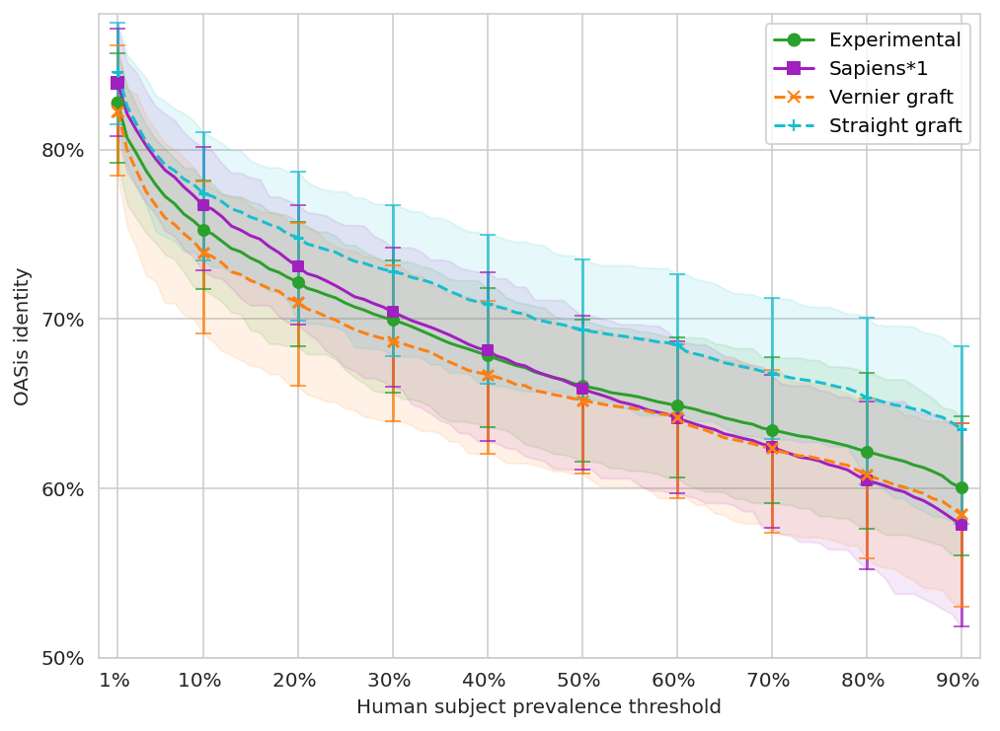

In [52]:
colors = {n: c for n, c in COLORS.items() if n in [EXPERIMENTAL['name'], SAPIENS['name'], VERNIER_GRAFT['name'], STRAIGHT_GRAFT['name']]}
plot_oasis_curves(oasis_curves, groupby='Method', errorbars=True, colors=colors, thresholds=False, linestyles=LINESTYLES, figsize=(8, 6))
ax = plt.gca()
ax.set_ylim(0.50, 0.88);
ax.legend();

# T20 Humanness

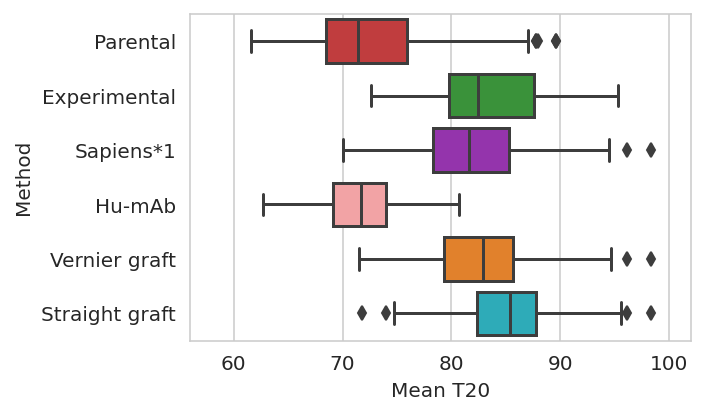

In [53]:
with sns.axes_style('whitegrid'):
    fig, ax = plt.subplots(figsize=(5, 3))
    ax = sns.boxplot(
        data=t20_scores, 
        x='t20', 
        y='Method',
        hue_order=COLORS.keys(),
        palette=COLORS.values(),
        ax=ax
    );
    ax.set_xlabel(f'Mean T20')
    ax.set_xticks(range(50, 101, 10))
    ax.set_xlim([56, 102])
fig.tight_layout();

In [54]:
t20_scores.groupby('Method')['t20'].mean().apply('{:.1f}%'.format)

Method
Experimental      83.4%
Hu-mAb            71.6%
Parental          72.7%
Sapiens*1         82.5%
Straight graft    85.2%
Vernier graft     83.1%
Name: t20, dtype: object

# Humanness-Preservation Tradeoff

In [55]:
preservation = positions.groupby(['Method','name'])['conservation'].value_counts(normalize=True).unstack()[['Back-mutated','Conserved']].sum(axis=1)
preservation

Method         name          
Experimental   Abituzumab        0.866667
               Afutuzumab        0.878788
               Alacizumab        0.875000
               Alemtuzumab       0.745614
               Anrukinzumab      0.851528
                                   ...   
Vernier graft  Visilizumab       0.876106
               Vonlerolizumab    0.830357
               Vorsetuzumab      0.882096
               Vunakizumab       0.829694
               Zenocutuzumab     0.805195
Length: 912, dtype: float64

In [56]:
vernier_preservation = vernier_positions.groupby(['Method','name'])['conservation'].value_counts(normalize=True).unstack()[['Back-mutated','Conserved']].sum(axis=1)
vernier_preservation

Method         name          
Experimental   Abituzumab        0.833333
               Afutuzumab        0.900000
               Alacizumab        0.966667
               Alemtuzumab       0.733333
               Anrukinzumab      0.900000
                                   ...   
Vernier graft  Visilizumab       1.000000
               Vonlerolizumab    1.000000
               Vorsetuzumab      1.000000
               Vunakizumab       1.000000
               Zenocutuzumab     1.000000
Length: 912, dtype: float64

In [57]:
def plot_tradeoff(data, ax=None, s=50, text=True, ticklim=None, tickstep=0.1, **kwargs):
    x = data.iloc[:,0]
    y = data.iloc[:,1]
    ax = sns.scatterplot(
        data=data,
        x=x,
        y=y,
        hue='Method',
        palette=COLORS,
        legend=False,
        s=s,
        ax=ax,
        **kwargs
    )
    ax.grid(False)
    if text:
        for method, row in data.iterrows():
            if method == PARENTAL['name']:
                ax.text(row[0], row[1], '  '+method, fontsize=11, ha='left', va='center')
            else:
                ax.text(row[0], row[1], method+'  ', fontsize=11, ha='right', va='center')
    
    ax.set_yticks(ax.get_yticks());
    if ticklim is not None:
        xmin, xmax = ticklim
    else:
        xmin = (ax.get_xlim()[0]*100//5*5)/100
        xmax = ax.get_xlim()[1]
    xticks = np.arange(xmin, xmax+0.01, tickstep)
    ax.set_xticks(xticks);
    ax.set_yticklabels([f'{v:.0%}' for v in ax.get_yticks()]);
    ax.set_xticklabels([f'{v:+.0%}' for v in xticks]);
    ax.set_ylim([ax.get_ylim()[0], 1.015])

In [58]:
tradeoff = pd.DataFrame({
        'Preservation': preservation,
        'Vernier preservation': vernier_preservation,
        'OASis identity': oasis_curves.set_index(['Method', 'Antibody'])['50%'],
        'T20 score': t20_scores.set_index(['Method', 'Antibody'])['t20'],
})
tradeoff.index.names = ('Method', 'Antibody')
tradeoff['OASis improvement'] = tradeoff.apply(
    lambda row: row['OASis identity'] - tradeoff['OASis identity'].loc[(PARENTAL['name'], row.name[1])],
    axis=1
)
tradeoff['T20 improvement'] = tradeoff.apply(
    lambda row: row['T20 score'] - tradeoff['T20 score'].loc[(PARENTAL['name'], row.name[1])],
    axis=1
)
tradeoff.head()

Preservation  Vernier preservation  OASis identity  \
Method       Antibody                                                           
Experimental Abituzumab        0.866667              0.833333        0.665072   
             Afutuzumab        0.878788              0.900000        0.651163   
             Alacizumab        0.875000              0.966667        0.653846   
             Alemtuzumab       0.745614              0.733333        0.636792   
             Anrukinzumab      0.851528              0.900000        0.751174   

                           T20 score  OASis improvement  T20 improvement  
Method       Antibody                                                     
Experimental Abituzumab    80.234320           0.277512          8.32275  
             Afutuzumab    83.727720           0.288372          9.91335  
             Alacizumab    84.340070           0.173077         10.53115  
             Alemtuzumab   78.961085           0.344340         10.31030  
             Anrukinzumab  85.109620           0.145540         10.16395

In [59]:
mean_tradeoff = tradeoff.groupby(level=0).mean()
mean_tradeoff

,Preservation,Vernier preservation,OASis identity,T20 score,OASis improvement,T20 improvement
Method,,,,,,
Experimental,0.839892,0.869956,0.660619,83.400103,0.296246,10.710574
Hu-mAb,0.934096,0.939254,0.407555,71.608976,0.043182,-1.080553
Parental,1.000000,1.000000,0.364373,72.689529,0.000000,0.000000
Sapiens*1,0.888992,0.889254,0.659073,82.499740,0.294700,9.810211
Straight graft,0.841180,0.795833,0.693723,85.234743,0.329350,12.545214
Vernier graft,0.868069,1.000000,0.652040,83.145800,0.287667,10.456272


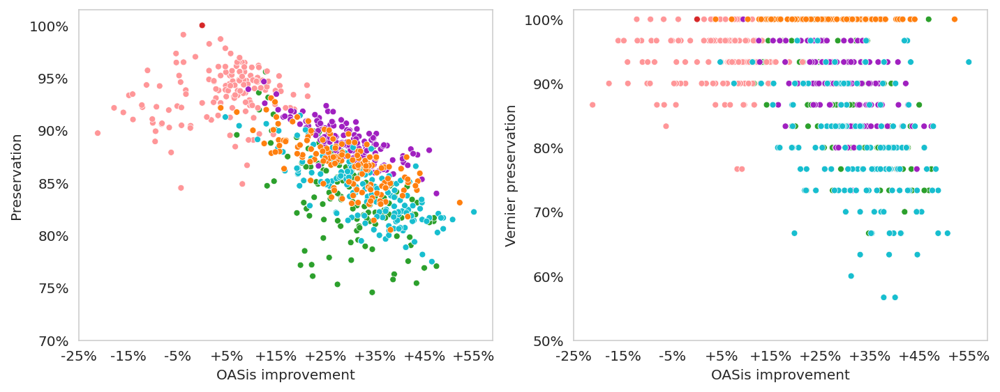

In [60]:
with sns.axes_style('whitegrid'):
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    plot_tradeoff(tradeoff[['OASis improvement', 'Preservation']].reset_index(level=1, drop=True), text=False, s=20, ax=axes[0])
    plot_tradeoff(tradeoff[['OASis improvement', 'Vernier preservation']].reset_index(level=1, drop=True), text=False, s=20, ax=axes[1])
    fig.tight_layout();

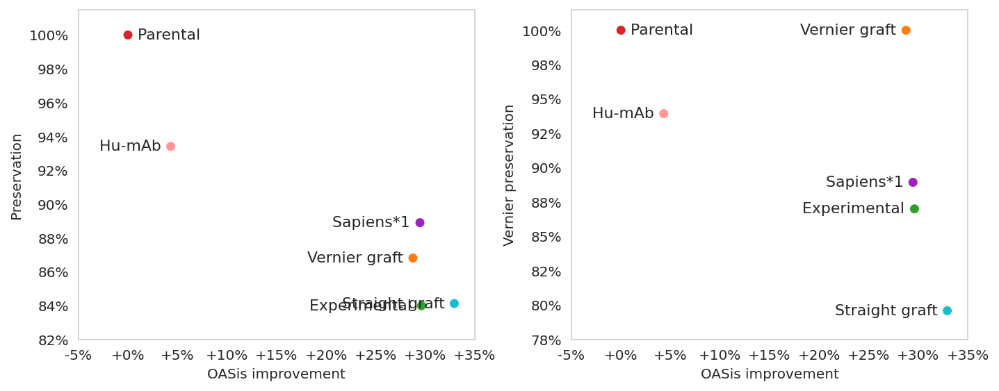

In [61]:
with sns.axes_style('whitegrid'):
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    plot_tradeoff(mean_tradeoff[['OASis improvement', 'Preservation']], ax=axes[0], tickstep=0.05)
    plot_tradeoff(mean_tradeoff[['OASis improvement', 'Vernier preservation']], ax=axes[1], tickstep=0.05)
    fig.tight_layout();

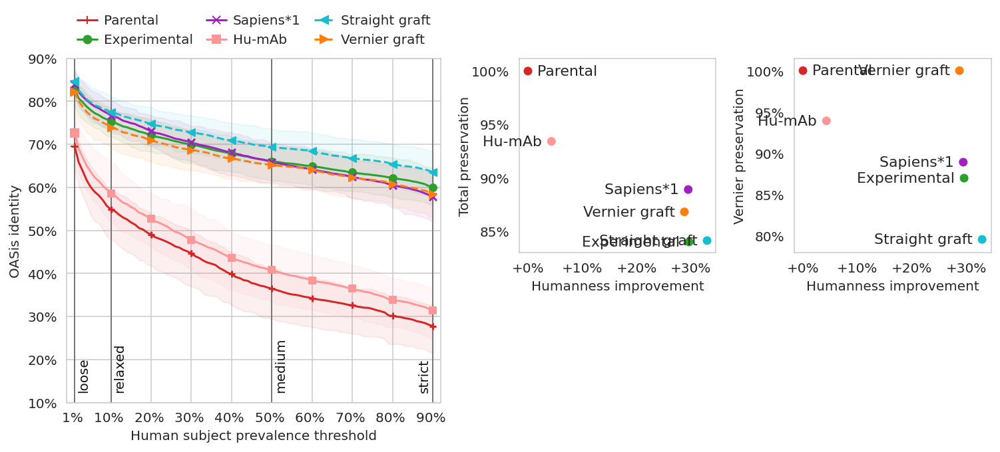

In [62]:
with sns.axes_style('whitegrid'):
    fig = plt.figure(figsize=(10.5, 4.8))
    gs = fig.add_gridspec(2, 3, width_ratios=[1.9, 1, 1], height_ratios=[2, 1])
    ax1 = fig.add_subplot(gs[:, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    ax3 = fig.add_subplot(gs[1, 1])
    ax4 = fig.add_subplot(gs[0, 2])
    ax5 = fig.add_subplot(gs[1, 2])

    ax = ax1
    plot_oasis_curves(
        oasis_curves, 
        groupby='Method', 
        ncol=3, 
        colors=SELECTED_COLORS, 
        linestyles=LINESTYLES, 
        lw=1.5, 
        ylim=(0.1, 0.9),
        markers='+oxs<>',
        fill_alpha=0.07,
        ax=ax
    )
    name = SAPIENS['name']
    colors = {
        'Baseline': COLORS['Experimental'],
        'Prediction': COLORS[name]
    }
    ax3.set_visible(False)
    ax5.set_visible(False)
    
    plot_tradeoff(mean_tradeoff[['OASis improvement', 'Preservation']], ax=ax2, ticklim=(0, 0.35))
    ax2.set_ylim(0.83, 1.012)
    ax2.set_xlabel('Humanness improvement')
    ax2.set_ylabel('Total preservation')
    ax2.yaxis.labelpad = 0
    
    plot_tradeoff(mean_tradeoff[['OASis improvement', 'Vernier preservation']], ax=ax4, ticklim=(0, 0.35))
    ax4.set_ylim(0.78)
    ax4.set_xlabel('Humanness improvement')
    ax4.yaxis.labelpad = 0

    fig.tight_layout()
    fig.savefig('../../data/figures/main/fig6a.pdf', bbox_inches='tight')

# Result table

In [63]:
table = pd.DataFrame({
    ('Humanness improvement', 'OASis (medium)'): mean_tradeoff['OASis improvement'],
    ('Humanness improvement', 'T20'): mean_tradeoff['T20 improvement'] / 100,
    ('Parental preservation', 'Total'): mean_tradeoff['Preservation'],
    ('Parental preservation', 'Vernier'): mean_tradeoff['Vernier preservation'],
    ('Mutation precision', 'Total'): precision,
    ('Mutation precision', 'Vernier'): vernier_precision
})
table = table.drop([PARENTAL['name']])
table.apply({
    table.columns[0]: lambda col: col.apply('{:+.1%}'.format),
    table.columns[1]: lambda col: col.apply('{:+.1%}'.format),
    table.columns[2]: lambda col: col.apply('{:.1%}'.format),
    table.columns[3]: lambda col: col.apply('{:.1%}'.format),
    table.columns[4]: lambda col: col.apply('{:.1%}'.format),
    table.columns[5]: lambda col: col.apply('{:.1%}'.format)
})

Humanness improvement         Parental preservation          \
                      OASis (medium)     T20                 Total Vernier   
Method                                                                       
Experimental                  +29.6%  +10.7%                 84.0%   87.0%   
Hu-mAb                         +4.3%   -1.1%                 93.4%   93.9%   
Sapiens*1                     +29.5%   +9.8%                 88.9%   88.9%   
Straight graft                +32.9%  +12.5%                 84.1%   79.6%   
Vernier graft                 +28.8%  +10.5%                 86.8%  100.0%   

               Mutation precision          
                            Total Vernier  
Method                                     
Experimental               100.0%  100.0%  
Hu-mAb                      36.4%   25.3%  
Sapiens*1                   72.3%   47.5%  
Straight graft              64.1%   36.4%  
Vernier graft               69.8%    nan%

In [64]:
for method, rows in tradeoff.groupby(level=0):
    print('')
    print(method)
    display(rows.sort_values('T20 improvement')[['T20 improvement','T20 score']])


Experimental


T20 improvement  T20 score
Method       Antibody                                  
Experimental Prasinezumab          -0.221250  89.339185
             Citatuzumab            0.357150  88.131920
             Oportuzumab            0.357150  88.131920
             Spartalizumab          1.329150  75.112770
             Cantuzumab             1.809300  77.723270
...                                      ...        ...
             Vonlerolizumab        16.924985  83.622570
             Enokizumab            17.993750  83.957870
             Timigutuzumab         18.594985  89.552785
             Trastuzumab           18.594985  89.552785
             Zenocutuzumab         22.034315  94.997685

[152 rows x 2 columns]


Hu-mAb


T20 improvement  T20 score
Method Antibody                                 
Hu-mAb Sofituzumab         -15.762185  67.126085
       Tigatuzumab         -15.382900  69.484120
       Gatipotuzumab       -15.232700  72.676285
       Citatuzumab         -13.865200  73.909570
       Oportuzumab         -13.865200  73.909570
...                               ...        ...
       Nemolizumab           4.400850  71.928520
       Pertuzumab            4.457900  73.801220
       Galcanezumab          4.619150  73.234620
       Tislelizumab          4.766685  73.785920
       Blosozumab            4.771700  70.573070

[152 rows x 2 columns]


Parental


T20 improvement  T20 score
Method   Antibody                                 
Parental Abituzumab                 0.0  71.911570
         Palivizumab                0.0  65.573735
         Parsatuzumab               0.0  70.082620
         Pateclizumab               0.0  70.293720
         Pembrolizumab              0.0  67.019485
...                                 ...        ...
         Gatipotuzumab              0.0  87.908985
         Gemtuzumab                 0.0  77.212470
         Gevokizumab                0.0  71.552820
         Ficlatuzumab               0.0  68.308520
         Zenocutuzumab              0.0  72.963370

[152 rows x 2 columns]


Sapiens*1


T20 improvement  T20 score
Method    Antibody                                 
Sapiens*1 Solanezumab           4.187065  93.797335
          Lintuzumab            5.142500  84.484485
          Lorvotuzumab          5.279550  85.506270
          Quilizumab            5.544150  83.381320
          Tislelizumab          5.613200  74.632435
...                                  ...        ...
          Inotuzumab           13.410350  81.189170
          Ifabotuzumab         13.687400  86.942670
          Fibatuzumab          13.687400  86.942670
          Teplizumab           14.395500  80.514070
          Zenocutuzumab        15.131150  88.094520

[152 rows x 2 columns]


Straight graft


T20 improvement  T20 score
Method         Antibody                                 
Straight graft Lampalizumab          2.397550  71.804520
               Anrukinzumab          3.340800  78.286470
               Lintuzumab            5.435300  84.777285
               Solanezumab           5.972815  95.583085
               Vorsetuzumab          6.150285  78.331520
...                                       ...        ...
               Enokizumab           18.133950  84.098070
               Denintuzumab         18.587615  85.735135
               Tislelizumab         18.848335  87.867570
               Teplizumab           19.492050  85.610620
               Zenocutuzumab        21.748600  94.711970

[152 rows x 2 columns]


Vernier graft


T20 improvement  T20 score
Method        Antibody                                 
Vernier graft Anrukinzumab          2.481100  77.426770
              Lampalizumab          2.701300  72.108270
              Bapineuzumab          4.723000  83.476970
              Lintuzumab            4.894750  84.236735
              Solanezumab           4.901365  94.511635
...                                      ...        ...
              Tislelizumab         15.160685  84.179920
              Teplizumab           15.219350  81.337920
              Pertuzumab           15.319400  84.662720
              Denintuzumab         16.509965  83.657485
              Zenocutuzumab        18.790550  91.753920

[152 rows x 2 columns]

In [65]:
tradeoff.loc['Parental'].loc['Prasinezumab']

Preservation             1.000000
Vernier preservation     1.000000
OASis identity           0.568075
T20 score               89.560435
OASis improvement        0.000000
T20 improvement          0.000000
Name: Prasinezumab, dtype: float64